# Film segmentation

## Based on RGB

In [76]:
import imageio.v3 as iio
import matplotlib.pyplot as plt
import numpy as np

from skimage.color import rgb2gray

img_path = "/media/luis/TOMO/Dosepy/BQT_INCAN/Tiff/fondo001.tif"
img = iio.imread(img_path)

from matplotlib import colors

r = img[:,:,0]
g = img[:,:,1]
b = img[:,:,2]

In [77]:
pixel_colors = img.reshape((np.shape(img)[0]*np.shape(img)[1], 3))
norm = colors.Normalize(vmin=-1, vmax=1)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

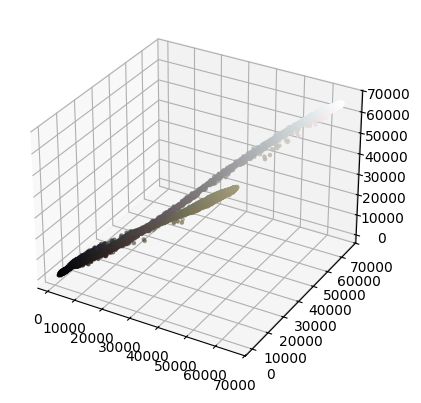

In [78]:
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
axis.scatter3D(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
plt.show()

# Cleaning variables
del r, g, b, fig, axis

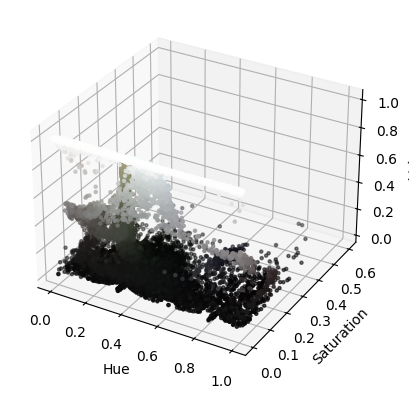

In [79]:
from skimage.color import rgb2hsv

hsv_img = rgb2hsv(img)

h = hsv_img[:,:,0]
s = hsv_img[:,:,1]
v = hsv_img[:,:,2]

fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()

del fig, axis

## Segmentation based on HSV 

In [80]:
import numpy.ma as ma

mask_h = ma.masked_less(h, 0.32)
mask_s = ma.masked_less(s, 0.35)
mask_v = ma.masked_less(v, 0.75)

film = 0*np.zeros(img.shape)

film[:,:,0]=mask_h.mask
film[:,:,1]=mask_s.mask
film[:,:,2]=mask_v.mask

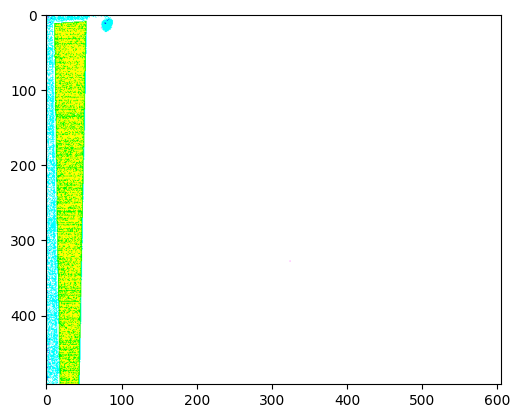

In [81]:
plt.imshow(film)

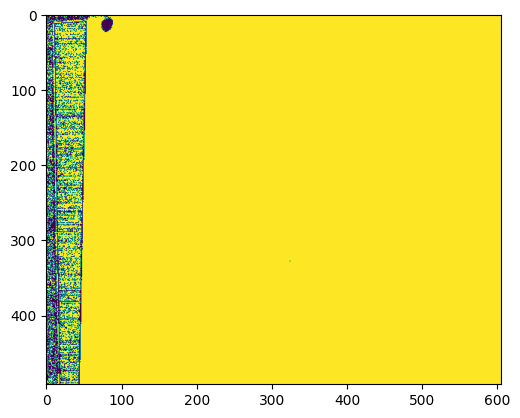

In [82]:
mask_binary = np.logical_and(film[:,:,0], film[:,:,1], film[:,:,2])
plt.imshow(mask_binary)

In [83]:
mask_binary

array([[1., 0., 0., ..., 1., 1., 1.],
       [1., 1., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       ...,
       [0., 1., 1., ..., 1., 1., 1.],
       [1., 1., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]], shape=(492, 605))

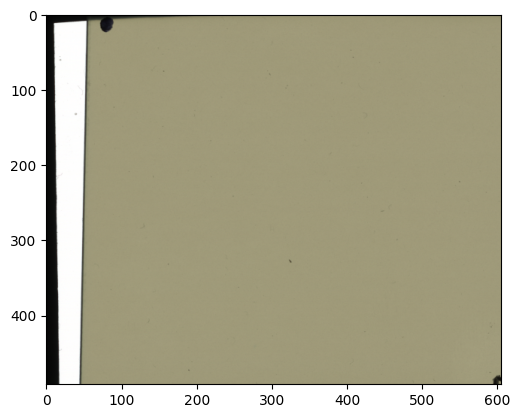

In [84]:
plt.imshow(img/np.max(img))

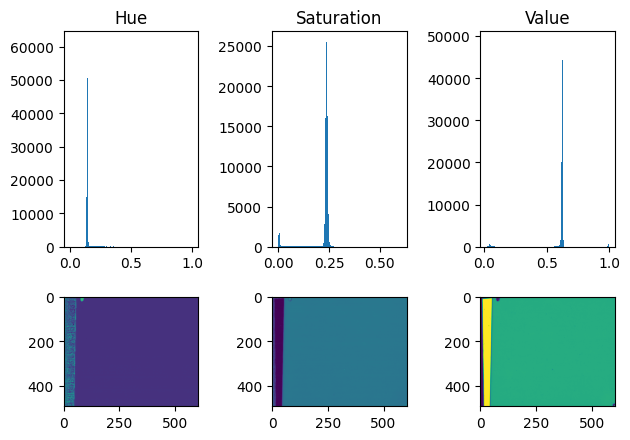

In [85]:
fig = plt.figure(tight_layout=True)
ax1 = fig.add_subplot(231)
ax2 = fig.add_subplot(232)
ax3 = fig.add_subplot(233)
ax4 = fig.add_subplot(234)
ax5 = fig.add_subplot(235)
ax6 = fig.add_subplot(236)

ax1.hist(h.ravel(), 512)
ax1.set_title("Hue")
ax2.hist(s.ravel(), 512)
ax2.set_title("Saturation")
ax3.hist(v.ravel(), 512)
ax3.set_title("Value")
ax4.imshow(h)
ax5.imshow(s)
ax6.imshow(v)

In [86]:
hue_after_thresh = np.logical_and(h > 0.05, h < 0.29)
sat_after_thresh = s > 0.1
val_after_thresh = np.logical_and(v > 0.40, v < 0.9)
binary_img = np.logical_and(hue_after_thresh, sat_after_thresh, val_after_thresh)

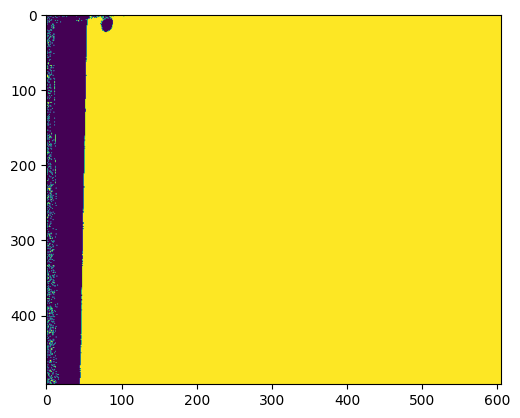

In [87]:
plt.imshow(binary_img)

In [88]:
import skimage
from skimage.morphology import square
from skimage.measure import label, regionprops
from numpy import ndarray
import imageio.v3 as iio
import matplotlib.pyplot as plt
from skimage.color import rgb2hsv
import numpy as np

In [89]:

bi_img_filtered = skimage.morphology.binary_erosion(binary_img, mode="min", footprint=square(5))

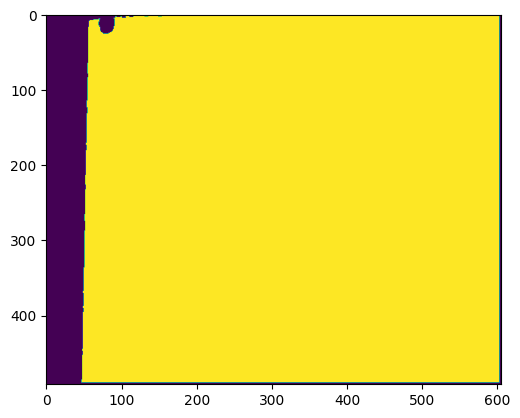

In [90]:
plt.imshow(bi_img_filtered)

In [91]:
# Cleaning variables
del img, hsv_img, h, s, v, mask_h, mask_s, mask_v, film, mask_binary, hue_after_thresh, sat_after_thresh, val_after_thresh, binary_img

In [92]:
def get_labeled_objects(
        img: ndarray,
        return_num: bool = False,
        show: bool = False,
        threshold: tuple[float, float] = (0.1, 0.8),
        min_area: float = 100
        ):
    """
    Get an array of labeled connected regions of an Image.

    Bright and black regions and also regions with an area less than a given value, are excluded.

    Parameters
    ----------

    Returns
    -------
    labeled_img : ndarray
        Image with labeled regions
    num_labels : int
        Number of labeled regions if return_num is True

    """
    # Convert to HSV
    hsv_img = rgb2hsv(img)
    #h = hsv_img[:, :, 0]
    #s = hsv_img[:, :, 1]
    v = hsv_img[:, :, 2]

    # Get binary with thresholding
    ## If v is LOW, it is a DARK region
    ## If v is HIGH, it is a BRIGHT region
    binary_img = np.logical_and(v > threshold[0], v < threshold[1])

    # Filter for small bright spots
    bi_img_filtered = skimage.morphology.binary_erosion(
        binary_img,
        mode="min",
        footprint=square(3)
        )

    # Get labeled regions and properties
    labeled_img = label(bi_img_filtered)
    properties = regionprops(label_image = labeled_img)

    # Remove objects with area less than 10 x 10 mm^2

    ## What is the number of pixels in 10 x 10 mm^2?
    ## [10 mm (1 inch / 25.4 mm) (300 pixels / 1 inch)]**2
    ##               ^- mm to inch       ^- inch to pixels

    minimum_area = int(min_area * (1/25.4)**2 * (75)**2)
    print(f"The minimum area in pixels is: {minimum_area}")

    film_counter = 0  # Used to reset label number

    for n, p in enumerate(properties, start = 1):
        
        if p.area < minimum_area:  # Remove small regions
            labeled_img[labeled_img == n] = 0

        else:
            film_counter += 1
            print(f"Object num. {film_counter}")
            labeled_img[labeled_img == n] = film_counter
            

    # Plot histogram if show is True
    if show:
        fig = plt.figure(tight_layout=True)
        ax1 = fig.add_subplot(121)
        ax2 = fig.add_subplot(122)

        ax1.imshow(v)
        ax1.set_title("Value")
        ax2.hist(v.ravel(), 512)

    if return_num:
        return (labeled_img, film_counter)
    else:
        return labeled_img

# Testing the get_labeled_function

The minimum area in pixels is: 871
Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6
Object num. 7
Object num. 8
Object num. 9
Number of detected films: 9


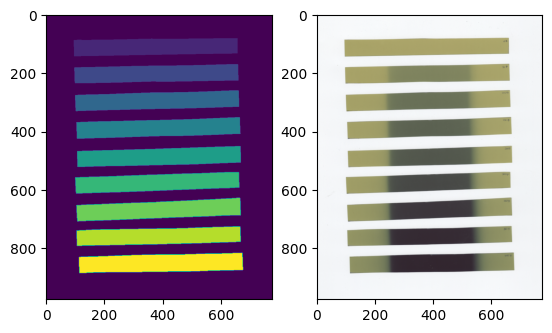

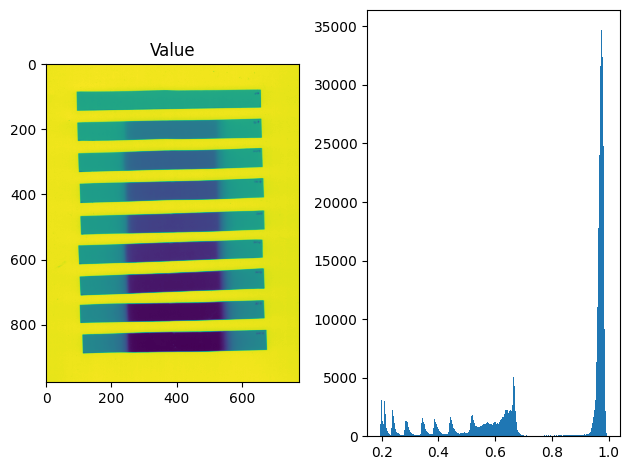

In [93]:
#cal_file_path = "/home/luis/Documents/GitHub/Dosepy/docs/Jupyter/cal_48h.tif"
cal_file_path = "/home/luis/Dosepy/docs/Jupyter/cal_48h.tif"
img = iio.imread(cal_file_path)

fig = plt.figure()
axes = fig.subplots(1, 2)

labels, num = get_labeled_objects(img, show=True, return_num=True)
print(f"Number of detected films: {num}")
axes[0].imshow(labels)
axes[1].imshow(img/np.max(img))

# Cleaning variables
del fig, axes, img

The minimum area in pixels is: 871
Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6
Object num. 7
Object num. 8
Object num. 9
Object num. 10
Object num. 11
Object num. 12
Object num. 13
Object num. 14
Number of detected films: 14


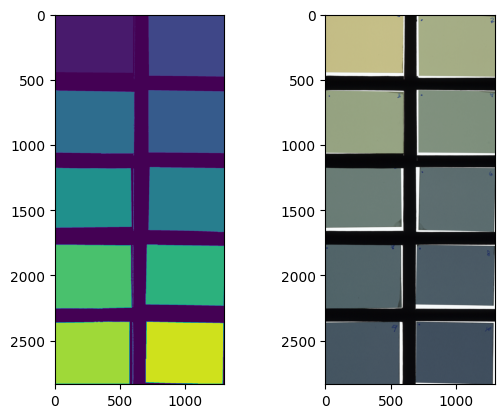

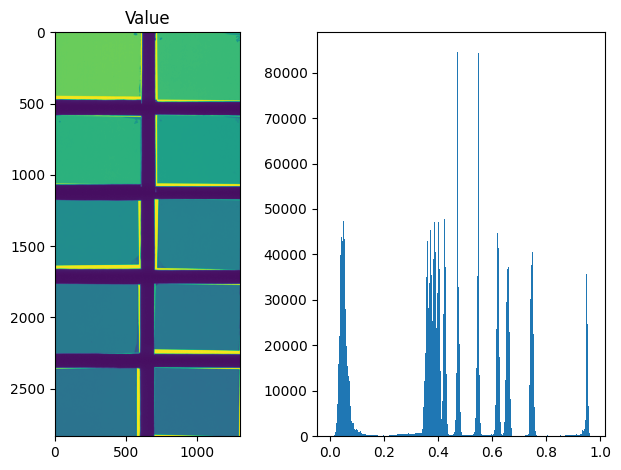

In [94]:
#cal_file_path = "/home/luis/Documents/GitHub/Dosepy/docs/Jupyter/Calibracion_Post.tif"
cal_file_path = "/home/luis/Dosepy/docs/Jupyter/Calibracion_Post.tif"
img = iio.imread(cal_file_path)

fig = plt.figure()
axes = fig.subplots(1, 2)

labels, num = get_labeled_objects(img, show=True, return_num=True)
print(f"Number of detected films: {num}")
axes[0].imshow(labels)
axes[1].imshow(img/np.max(img))

del img, fig, axes, labels, num

The minimum area in pixels is: 871
Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6
Object num. 7
Object num. 8
Object num. 9
Object num. 10
Object num. 11
Number of detected films: 11


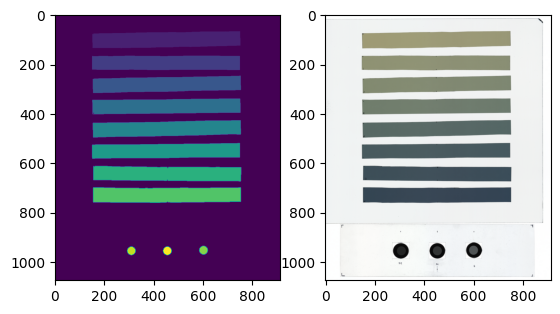

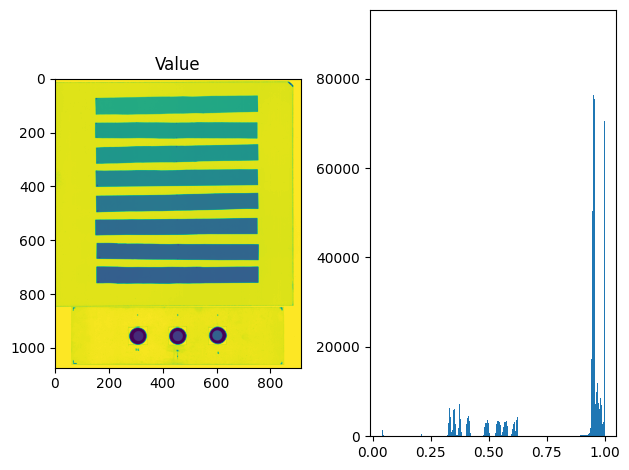

In [95]:
cal_file_path = "/media/luis/TOMO/Tiff Films/EBT4/6NOV24_CAL/CAL20241106_001.tif"

img = iio.imread(cal_file_path)

fig = plt.figure()
axes = fig.subplots(1, 2)

labels, num = get_labeled_objects(img, show=True, return_num=True)
print(f"Number of detected films: {num}")
axes[0].imshow(labels)
axes[1].imshow(img/np.max(img))

del img, fig, axes, labels, num

The minimum area in pixels is: 871
Object num. 1
Number of detected objects: 1


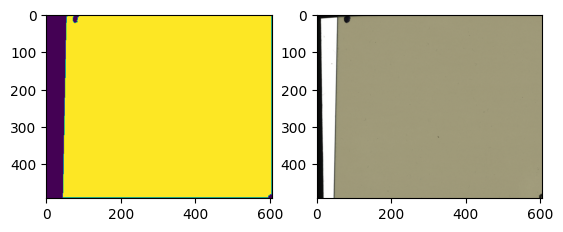

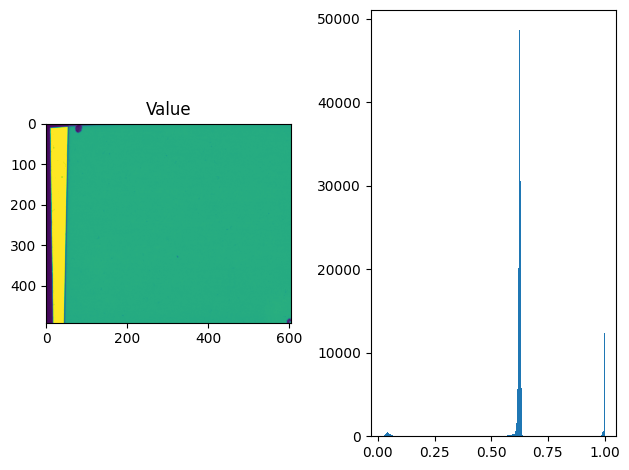

In [96]:

cal_file_path = "/media/luis/TOMO/Dosepy/BQT_INCAN/Tiff/fondo001.tif"

img = iio.imread(cal_file_path)

fig = plt.figure()
axes = fig.subplots(1, 2)

labels, num = get_labeled_objects(img, show=True, return_num=True)
print(f"Number of detected objects: {num}")
axes[0].imshow(labels)
axes[1].imshow(img/np.max(img))

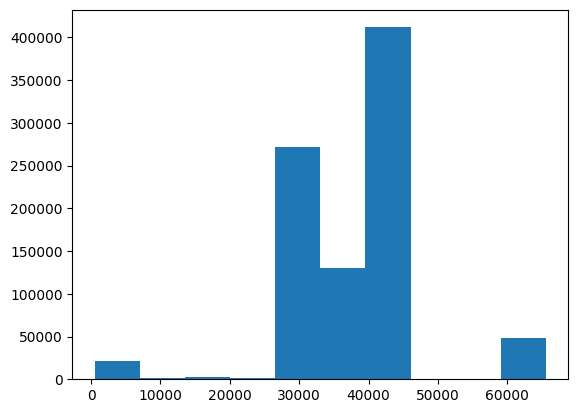

In [97]:
plt.hist(img.ravel())

del img, fig, axes, labels, num

The minimum area in pixels is: 871
Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6
Number of detected films: 6


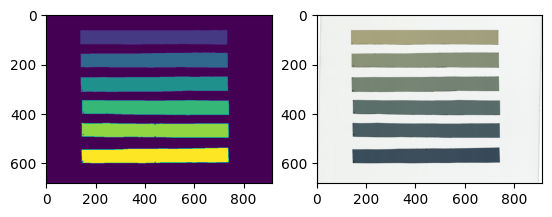

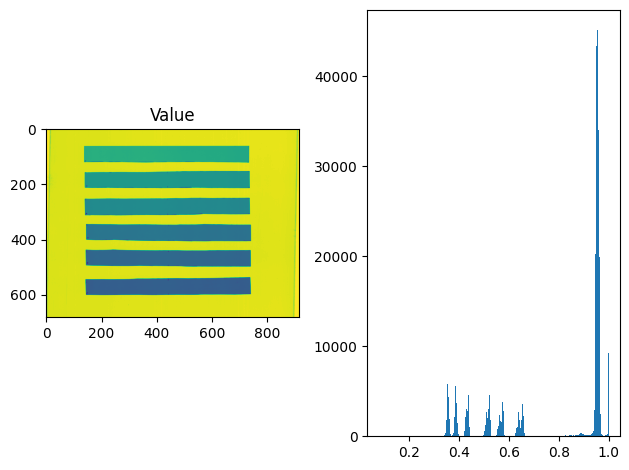

In [98]:

cal_file_path = "/home/luis/Dosepy/tests/unit/fixtures/CAL/film20240620_002.tif"

img = iio.imread(cal_file_path)

fig = plt.figure()
axes = fig.subplots(1, 2)

labels, num = get_labeled_objects(img, show=True, return_num=True)
print(f"Number of detected films: {num}")
axes[0].imshow(labels)
axes[1].imshow(img/np.max(img))

del img, fig, axes, labels, num

# Uso del método set_labeled_films_and_filters
## 10 ENE 2025

### Calibration file

Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Mean: 20734
STD: 125
Mean: 13275
STD: 80
Mean: 9335
STD: 79


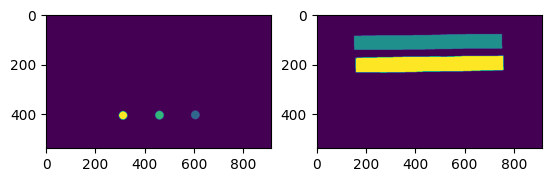

In [99]:
from Dosepy.image import load
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt

file_path = "/home/luis/Documents/GitHub/Dosepy/tests/unit/fixtures/CAL20241106_001.tif"
file_path = "/home/luis/Dosepy/tests/unit/fixtures/Ver_050dpi20241106_001.tif"  # On my laptop
img = load(file_path)
img.set_labeled_films_and_filters()

fig, axes = plt.subplots(1, 2)
axes[0].imshow(img.labeled_optical_filters)
axes[1].imshow(img.labeled_films)

labeled_filters = label(img.labeled_optical_filters)
properties = regionprops(labeled_filters, intensity_image=img.array[:,:,0])

for p in properties:
    print(f"Mean: {int(p.intensity_mean)}")
    print(f"STD: {int(p.intensity_std)}")

del img, fig, axes, labeled_filters, properties

### Verification file

Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Mean: 20734
STD: 125
Mean: 13275
STD: 80
Mean: 9335
STD: 79


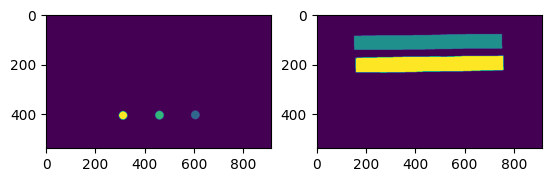

In [100]:
file_path = "/home/luis/Dosepy/tests/unit/fixtures/Ver_050dpi20241106_001.tif"
img = load(file_path)
img.set_labeled_films_and_filters()

fig, axes = plt.subplots(1, 2)
axes[0].imshow(img.labeled_optical_filters)
axes[1].imshow(img.labeled_films)

labeled_filters = label(img.labeled_optical_filters)
properties = regionprops(labeled_filters, intensity_image=img.array[:,:,0])

for p in properties:
    print(f"Mean: {int(p.intensity_mean)}")
    print(f"STD: {int(p.intensity_std)}")

del img, axes, labeled_filters, properties

In [101]:
from Dosepy.tiff2dose import Tiff2DoseM
from Dosepy.image import load
from Dosepy.calibration import LUT
import matplotlib.pyplot as plt

cal_file_path = "/home/luis/Dosepy/tests/unit/fixtures/CAL20241106_001.tif"
#cal_file_path = "/home/luis/Documents/GitHub/Dosepy/tests/unit/fixtures/CAL20241106_001.tif"
img_cal = load(cal_file_path)

cal = LUT(img_cal)
#cal.set_central_rois((180, 8))
cal.set_central_rois()
cal.set_doses([0, 0.5, 1, 2, 4, 6, 8, 10])
#cal.set_beam_profile("/home/luis/Documents/GitHub/Dosepy/tests/unit/fixtures/CAL/BeamProfile.csv")
cal.set_beam_profile("/home/luis/Dosepy/tests/unit/fixtures/CAL/BeamProfile.csv")
cal.compute_lateral_lut(filter=3)

#file_path = "/home/luis/Documents/GitHub/Dosepy/tests/unit/fixtures/Ver_050dpi20241106_001.tif"
file_path = "/home/luis/Dosepy/tests/unit/fixtures/Ver_050dpi20241106_001.tif"
img = load(file_path)

dose_converter = Tiff2DoseM()
dose = dose_converter.get_dose(img, "RP", cal)


Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6
Object num. 7
Object num. 8
Object num. 9
Object num. 10
Object num. 11
Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Inside RedPolynomialDoseConverter.get_zero_dose_intensity method


/home/luis/miniconda3/envs/dp/lib/python3.11/site-packages/Dosepy/tools/functions.py:19: RuntimeWarning:

divide by zero encountered in power

/home/luis/miniconda3/envs/dp/lib/python3.11/site-packages/Dosepy/tools/functions.py:19: RuntimeWarning:

invalid value encountered in power



<Axes: >

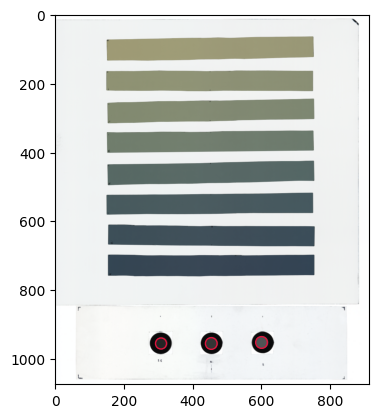

In [102]:
import numpy as np
#plt.imshow(img_cal.array/np.amax(img_cal.array))
cal.plot_roi_of_optical_filter()

<Axes: >

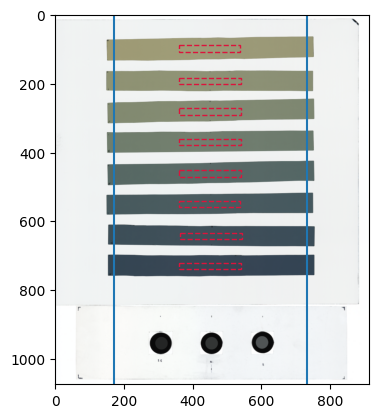

In [103]:
cal.plot_rois()

<Axes: >

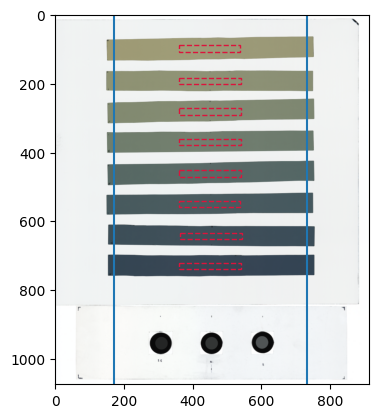

In [104]:
cal.set_central_rois()
cal.plot_rois()

In [105]:
cal.set_beam_profile("/home/luis/Dosepy/tests/unit/fixtures/CAL/BeamProfile.csv")
cal.compute_lateral_lut(filter=3)

#file_path = "/home/luis/Documents/GitHub/Dosepy/tests/unit/fixtures/Ver_050dpi20241106_001.tif"
file_path = "/home/luis/Dosepy/tests/unit/fixtures/Ver_050dpi20241106_001.tif"
img = load(file_path)

dose_converter = Tiff2DoseM()
dose = dose_converter.get_dose(img, "RP", cal)

Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Inside RedPolynomialDoseConverter.get_zero_dose_intensity method


In [106]:
dose_converter.dose_converter._get_zero_dose_intensity(img, "red", at_zero_position=False)

Inside RedPolynomialDoseConverter.get_zero_dose_intensity method
ROI of 30% size for zero dose:
x=191, y=363, width_roi=179, height_roi=20
Median intensity of zero dose film: 40131.5


(np.float64(40131.5), {'x': 191, 'y': 363, 'width': 179, 'height': 20})

5.179044787592484


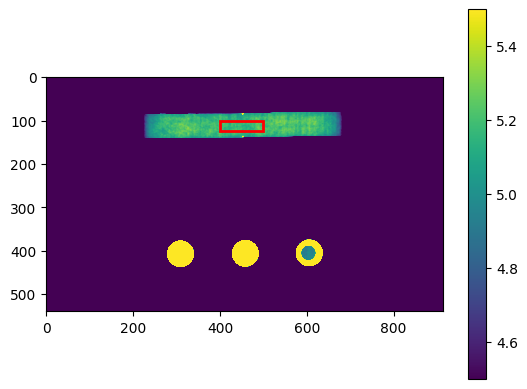

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
# Add a rectangle

rec = Rectangle((400, 100), 100, 25, fill = False, lw = 2, color = "red")

# Show the image with a colorbar
fig, ax = plt.subplots()
im = ax.imshow(dose.array, vmin=4.5, vmax=5.5)
ax.add_patch(rec)
fig.colorbar(im, ax = ax)

print(np.mean(dose.array[100:125, 400:500]))

In [108]:
from Dosepy.image import ArrayImage

dose_img = ArrayImage(dose.array*100, dpi=img.dpi)
dose_img.save_as_tif("dose.tif")

_get_dose_from_fit
calib_response
[-0.          0.04290664  0.07795839  0.1382488   0.24239174  0.3220781
  0.38879865  0.44267104]


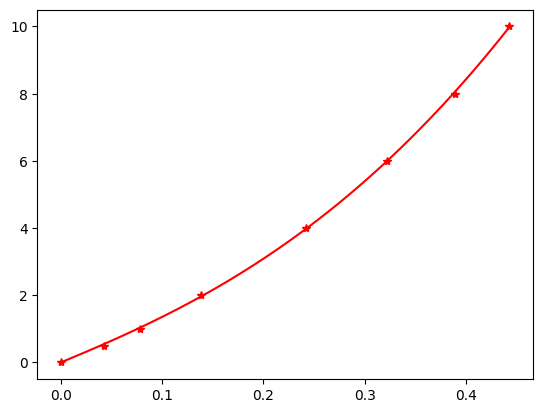

In [109]:
cal.plot_fit("polynomial", "red", 0)

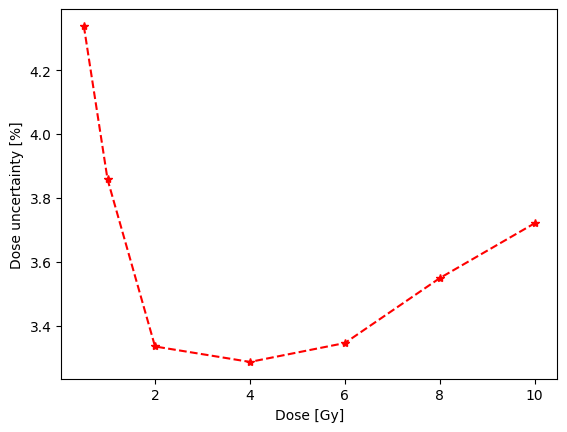

In [110]:
cal.plot_dose_fit_uncertainty(0, "red", "polynomial")

In [111]:
# Cleaning variables
del cal, img_cal, img, dose, dose_converter, rec, fig, ax, im, dose_img

# 17 Enero comparación perfiles

In [112]:
path_profile_6x_15x15_z5_ssd95 = "/home/luis/Documents/GitHub/Dosepy/tests/Film_profile_6X_Profile_15x15_5.csv"
path_profile_6x_15x15_z5_ssd95 = "/home/luis/Dosepy/tests/Film_profile_6X_Profile_15x15_5.csv"
profile_6x = np.genfromtxt(
    path_profile_6x_15x15_z5_ssd95,
    delimiter=",",
    skip_header=1
)

In [113]:
positions_6X = profile_6x[:,0]
origin = positions_6X[int(len(positions_6X)/2)]
positions_center_as_origin = positions_6X - origin

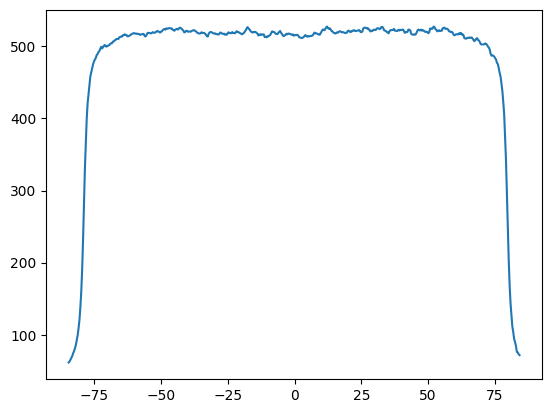

In [114]:
plt.plot(positions_center_as_origin, profile_6x[:,1])

In [115]:
from relative_dose_1d.tools import get_data

In [116]:
path_measured_profile = "/home/luis/Documents/GitHub/Dosepy/tests/Measured_6X_Profile_150x150_50mm.data"
path_measured_profile = "/home/luis/Dosepy/tests/Measured_6X_Profile_150x150_50mm.data"
measured_profile = get_data(path_measured_profile)

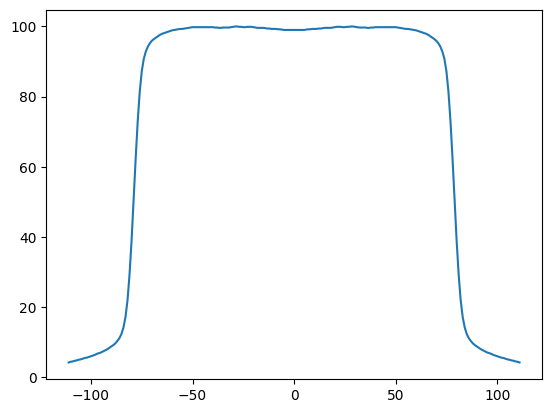

In [117]:
plt.plot(measured_profile[:,0], measured_profile[:,1])

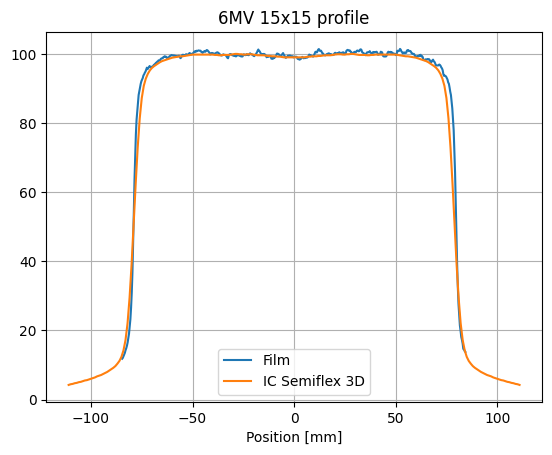

In [118]:
plt.plot(positions_center_as_origin, profile_6x[:,1]/5.2, label="Film")
plt.plot(measured_profile[:,0], measured_profile[:,1], label="IC Semiflex 3D")
plt.title("6MV 15x15 profile")
plt.xlabel("Position [mm]")
plt.grid()
plt.legend()

# Domingo 18 Enero 2025
TODO Cargar multiples archivos tiff y generar un TiffImage con el promedio de las imagenes

In [119]:
from Dosepy.tiff2dose import Tiff2DoseM
from Dosepy.image import load
from Dosepy.calibration import LUT
import matplotlib.pyplot as plt

In [120]:
path_to_cal = "/home/luis/Dosepy/tests/unit/fixtures/CAL/film20240620_002.tif"

img_cal = load(path_to_cal)

cal = LUT(img_cal)
cal.set_central_rois((180, 8))
cal.set_doses([0, 1, 2, 4, 6.5, 9.5])
#cal.set_beam_profile("/home/luis/Documents/GitHub/Dosepy/tests/unit/fixtures/CAL/BeamProfile.csv")
cal.set_beam_profile("/home/luis/Dosepy/tests/unit/fixtures/CAL/BeamProfile.csv")
cal.compute_lateral_lut(filter=3)

Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6


In [121]:
path_img = "/home/luis/Dosepy/tests/unit/fixtures/TO_DOSE/Film_a_20240711_002.tif"
img_qa = load(path_img)

dose_converter = Tiff2DoseM()
dose = dose_converter.get_dose(img_qa, "RP", cal)

Object num. 1
Object num. 2
Inside RedPolynomialDoseConverter.get_zero_dose_intensity method


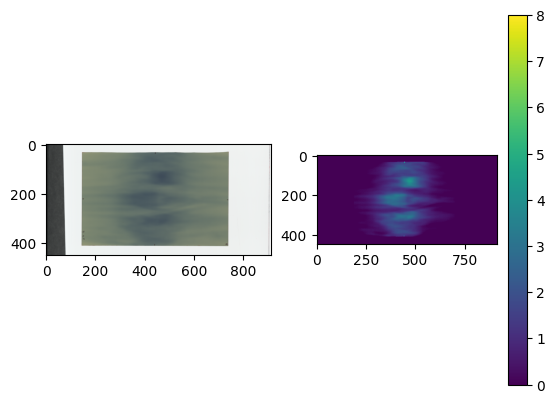

In [122]:
# Show the image with a colorbar
fig, axes = plt.subplots(1,2, )
img_qa.plot(ax=axes[0], show=False)
im = axes[1].imshow(dose.array, vmin=0, vmax=8)
fig.colorbar(im, ax = axes[1])

In [123]:
import plotly.express as px

fig = px.imshow(
    dose.array,
    zmin=0, zmax=6,
    color_continuous_scale="INFERNO",
    aspect="equal",
    )
fig.show()


In [124]:
fig.to_ordered_dict

<bound method BaseFigure.to_ordered_dict of Figure({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>color: %{z}<extra></extra>',
              'name': '0',
              'type': 'heatmap',
              'xaxis': 'x',
              'yaxis': 'y',
              'z': array([[0., 0., 0., ..., 0., 0., 0.],
                          [0., 0., 0., ..., 0., 0., 0.],
                          [0., 0., 0., ..., 0., 0., 0.],
                          ...,
                          [0., 0., 0., ..., 0., 0., 0.],
                          [0., 0., 0., ..., 0., 0., 0.],
                          [0., 0., 0., ..., 0., 0., 0.]], shape=(448, 914))}],
    'layout': {'coloraxis': {'cmax': 6,
                             'cmin': 0,
                             'colorscale': [[0.0, '#000004'], [0.1111111111111111,
                                            '#1b0c41'], [0.2222222222222222,
                                            '#4a0c6b'], [0.33333333333333

In [125]:
type(fig)

plotly.graph_objs._figure.Figure

In [126]:
fig.to_dict()

{'data': [{'coloraxis': 'coloraxis',
   'name': '0',
   'z': array([[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]], shape=(448, 914)),
   'type': 'heatmap',
   'xaxis': 'x',
   'yaxis': 'y',
   'hovertemplate': 'x: %{x}<br>y: %{y}<br>color: %{z}<extra></extra>'}],
 'layout': {'template': {'data': {'histogram2dcontour': [{'type': 'histogram2dcontour',
      'colorbar': {'outlinewidth': 0, 'ticks': ''},
      'colorscale': [[0.0, '#0d0887'],
       [0.1111111111111111, '#46039f'],
       [0.2222222222222222, '#7201a8'],
       [0.3333333333333333, '#9c179e'],
       [0.4444444444444444, '#bd3786'],
       [0.5555555555555556, '#d8576b'],
       [0.6666666666666666, '#ed7953'],
       [0.7777777777777778, '#fb9f3a'],
       [0.8888888888888888, '#fdca26'],
       [1.0, '#f0f921']]}],
    

In [127]:
fig.to_dict().get("data")[0].get("z").shape

(448, 914)

In [128]:
fig2 = px.imshow(img_qa.array)
fig2.show()

In [129]:
# Cleaning variables
del cal, img_cal, img_qa, dose, dose_converter, fig, axes, im, fig2

# Jueves 23, uso de ROIs

In [130]:
from Dosepy.image import load
from Dosepy.calibration import LUT
import matplotlib.pyplot as plt

Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6


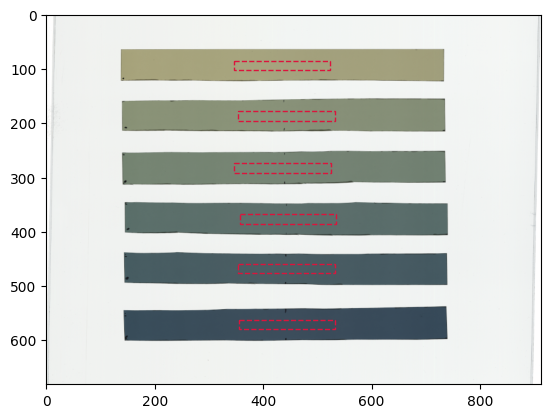

In [131]:
path_to_cal = "/home/luis/Dosepy/tests/unit/fixtures/CAL/film20240620_002.tif"

img_cal = load(path_to_cal)

cal = LUT(img_cal)
cal.set_central_rois(show=True)

In [132]:
cal.plot_roi_of_optical_filter()

No rois found


Object num. 1
Object num. 2
Object num. 3
Object num. 4
Object num. 5
Object num. 6
Object num. 7
Object num. 8
Object num. 9
Object num. 10


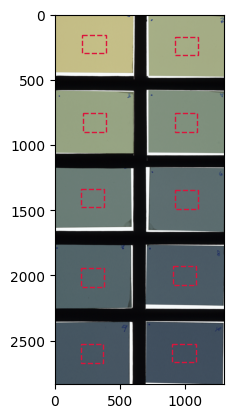

In [133]:
path_uso_plantilla = "/home/luis/Dosepy/docs/Jupyter/Calibracion_Post.tif"
img_plantilla = load(path_uso_plantilla)
cal_plantilla = LUT(img_plantilla)
cal_plantilla.set_central_rois(show=True)

In [134]:
# Cleaning variables
del cal, img_cal, cal_plantilla, img_plantilla